# Face Generation

In this project, you'll define and train a Generative Adverserial network of your own creation on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **defining new architectures training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset has higher resolution images than datasets you have previously worked with (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed-celeba-small/`.

In [1]:
# run this once to unzip the file
# ! yes | unzip processed-celeba-small.zip

In [2]:
from glob import glob
from typing import Tuple, Callable, Dict

import matplotlib.pyplot as plt
import numpy as np
import random
import torch
from PIL import Image

from torch.utils.data import DataLoader, Dataset
import torchvision
from torchvision import transforms as T
from torch.utils.tensorboard import SummaryWriter

import tests

/usr/local/lib/python3.8/dist-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
data_dir = 'processed_celeba_small/celeba/'

## Data pipeline

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA dataset and contains roughly 30,000 images. 

Your first task consists in building the dataloader. To do so, you need to do the following:
* implement the get_transforms function
* create a custom Dataset class that reads the CelebA data

### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. You have two constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [4]:
def get_transforms(size: Tuple[int, int]) -> Callable:
    """ Transforms to apply to the image."""
    # TODO: edit this function by appening transforms to the below list
    transforms = [
        T.Resize(size),
        T.ToTensor(),
        T.Normalize(mean=[.5, .5, .5], std=[.5, .5, .5]),
    ]
    
    return T.Compose(transforms)

### Exercise: implement the DatasetDirectory class


The `DatasetDirectory` class is a torch Dataset that reads from the above data directory. The `__getitem__` method should output a transformed tensor and the `__len__` method should output the number of files in our dataset. You can look at [this custom dataset](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#creating-a-custom-dataset-for-your-files) for ideas. 

In [5]:
class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from folder.
    args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format
    """
    def __init__(self, 
                 directory: str, 
                 transforms: Callable = None, 
                 extension: str = '.jpg'):
        # TODO: implement the init method
        self.transforms = transforms
        self.img_files = glob(directory + '*' + extension)

    def __len__(self) -> int:
        """ returns the number of items in the dataset """
        # TODO: return the number of elements in the dataset
        return len(self.img_files)

    def __getitem__(self, index: int) -> torch.Tensor:
        """ load an image and apply transformation """
        # TODO: return the index-element of the dataset
        image = Image.open(self.img_files[index])
        tensor = self.transforms(image) 
        return tensor

In [6]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
tests.check_dataset_outputs(dataset)

Congrats, your dataset implementation passed all the tests


The functions below will help you visualize images from the dataset.

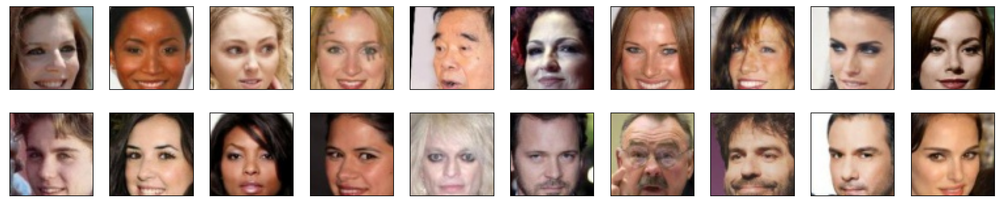

In [7]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

## Model implementation

As you know, a GAN is comprised of two adversarial networks, a discriminator and a generator. Now that we have a working data pipeline, we need to implement the discriminator and the generator. 

Feel free to implement any additional class or function.

### Exercise: Create the discriminator

The discriminator's job is to score real and fake images. You have two constraints here:
* the discriminator takes as input a **batch of 64x64x3 images**
* the output should be a single value (=score)

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips
* To scale down from the input image, you can either use `Conv2d` layers with the correct hyperparameters or Pooling layers.
* If you plan on using gradient penalty, do not use Batch Normalization layers in the discriminator.

In [8]:
from torch.nn import Module
from torch import nn

In [9]:
class ConvBlock(nn.Module):
    """
    A convolutional block is made of 3 layers: Conv -> BatchNorm -> Activation.
    args:
    - in_channels: number of channels in the input to the conv layer
    - out_channels: number of filters in the conv layer
    - kernel_size: filter dimension of the conv layer
    - batch_norm: whether to use batch norm or not
    """
    def __init__(self, in_channels: int, out_channels: int, kernel_size: int, batch_norm: bool = True):
        super(ConvBlock, self).__init__()
        ####
        # IMPLEMENT HERE
        ####
        self.batch_norm = batch_norm
        if batch_norm:
            self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride=2, padding=1, bias=False)
            self.bn = nn.BatchNorm2d(out_channels)
        else:
            self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride=2, padding=1, bias=True)
            
        self.activation = nn.LeakyReLU(0.2)
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        ####
        # IMPLEMENT HERE
        ####
        x = self.conv(x)
        if self.batch_norm:
            x = self.bn(x)
        x = self.activation(x)
        return x
        

class Discriminator(Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        # TODO: instantiate the different layers
        conv_dim = 32
        self.cb1 = ConvBlock(3, conv_dim, 4, False)  # (3, 64, 64) -> (32, 32, 32)
        self.cb2 = ConvBlock(conv_dim, 2 * conv_dim, 4, True)  # (32, 32, 32) -> (64, 16, 16)
        self.cb3 = ConvBlock(2 * conv_dim, 4 * conv_dim, 4, True)  # (64, 16, 16) -> (128, 8, 8)
        self.cb4 = ConvBlock(4 * conv_dim, 8 * conv_dim, 4, True)  # (128, 8, 8) -> (256, 4, 4)
        self.cb5 = ConvBlock(8 * conv_dim, 16 * conv_dim, 4, True)  # (256, 4, 4) -> (512, 2, 2)
        self.cb6 = ConvBlock(16 * conv_dim, 1, 4, False)  # (512, 2, 2) -> (1, 1, 1)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        x = self.cb1(x)
        x = self.cb2(x)
        x = self.cb3(x)
        x = self.cb4(x)
        x = self.cb5(x)
        x = self.cb6(x)
        return x

In [10]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to check your discriminator implementation
discriminator = Discriminator()
tests.check_discriminator(discriminator)

Congrats, your discriminator implementation passed all the tests


In [11]:
class DeconvBlock(nn.Module):
    """
    A "de-convolutional" block is made of 3 layers: ConvTranspose -> BatchNorm -> Activation.
    args:
    - in_channels: number of channels in the input to the conv layer
    - out_channels: number of filters in the conv layer
    - kernel_size: filter dimension of the conv layer
    - stride: stride of the conv layer
    - padding: padding of the conv layer
    - batch_norm: whether to use batch norm or not
    """
    def __init__(self, 
                 in_channels: int, 
                 out_channels: int, 
                 kernel_size: int, 
                 stride: int,
                 padding: int,
                 batch_norm: bool = True):
        super(DeconvBlock, self).__init__()
        ####
        # IMPLEMENT HERE
        ####
        self.batch_norm = batch_norm
        
        if batch_norm:
            self.convt = nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False)
            self.bn = nn.BatchNorm2d(out_channels)
        else:
            self.convt = nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=True)
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        ####
        # IMPLEMENT HERE
        ####
        x = self.convt(x)
        if self.batch_norm:
            x = self.bn(x)
        x = nn.functional.relu(x)
        return x

class Generator(Module):
    def __init__(self, latent_dim: int):
        super(Generator, self).__init__()
        # TODO: instantiate the different layers
        conv_dim = 16
        self.deconv1 = DeconvBlock(latent_dim, 8 * conv_dim, 4, 2, 0, True)  # (1, 1) -> (4, 4)
        self.deconv2 = DeconvBlock(8 * conv_dim, 4 * conv_dim, 4, 2, 1, True)  # (4, 4) -> (8, 8)
        self.deconv3 = DeconvBlock(4 * conv_dim, 2 * conv_dim, 4, 2, 1, True)  # (8, 8) -> (16, 16)
        self.deconv4 = DeconvBlock(2 * conv_dim, conv_dim, 4, 2, 1, True)  # (16, 16) -> (32, 32)
        self.deconv5 = nn.ConvTranspose2d(conv_dim, 3, 4, 2, 1)  # (32, 32) -> (64, 64)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        x = self.deconv1(x)
        x = self.deconv2(x)
        x = self.deconv3(x)
        x = self.deconv4(x)
        x = self.deconv5(x)
        x = torch.tanh(x)
        return x

In [12]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your generator implementation
latent_dim = 128
generator = Generator(latent_dim)
tests.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You may want to experiment with different optimizers, learning rates and other hyperparameters as they tend to impact the output quality.

### Exercise: implement the optimizers

In [13]:
import torch.optim as optim


def create_optimizers(generator: Module, discriminator: Module):
    """ This function should return the optimizers of the generator and the discriminator """
    # TODO: implement the generator and discriminator optimizers
    lr = 2e-4
    beta1 = 0.5
    beta2 = beta1**2

    g_optimizer = torch.optim.Adam(generator.parameters(), lr=lr, betas=(beta1, beta2))
    d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(beta1, beta2))
    return g_optimizer, d_optimizer

## Losses implementation

In this section, we are going to implement the loss function for the generator and the discriminator. You can and should experiment with different loss function.

Some tips:
* You can choose the commonly used the binary cross entropy loss or select other losses we have discovered in the course, such as the Wasserstein distance.
* You may want to implement a gradient penalty function as discussed in the course. It is not required and the code will work whether you implement it or not.

### Exercise: implement the generator loss

The generator's goal is to get the discriminator to think its generated images (= "fake" images) are real.

In [14]:
# def generator_loss(fake_logits):
#     """ Generator loss, takes the fake scores as inputs. """
#     # TODO: implement the generator loss 
#     smooth = False
#     batch_size = fake_logits.size(0)
#     # label smoothing
#     if smooth:
#         # smooth, real labels = 0.9
#         labels = torch.ones(batch_size).cuda() * 0.9
#     else:
#         labels = torch.ones(batch_size).cuda()  # real labels = 1
#     # binary cross entropy with logits loss
#     criterion = nn.BCEWithLogitsLoss()
#     # calculate loss
#     loss = criterion(fake_logits.squeeze(), labels)
#     return loss

def generator_loss(fake_logits):
    """ Wasserstein generator loss, takes the fake scores as inputs. """
    # TODO: implement the generator loss 
    fake_loss = -fake_logits.mean()
    return fake_loss

### Exercise: implement the discriminator loss

We want the discriminator to give high scores to real images and low scores to fake ones and the discriminator loss should reflect that.

In [15]:
# def discriminator_loss(real_logits, fake_logits):
#     """ Discriminator loss, takes the fake and real logits as inputs. """
#     # TODO: implement the discriminator loss
#     # Compute the discriminator loss on real, training images
#     real_loss = generator_loss(real_logits)

#     # Compute the discriminator loss on fake, generated images
#     batch_size = fake_logits.size(0)
#     labels = torch.zeros(batch_size).cuda()  # fake labels = 0
#     criterion = nn.BCEWithLogitsLoss()
#     # calculate loss
#     fake_loss = criterion(fake_logits.squeeze(), labels)
    
#     loss = real_loss + fake_loss
#     return loss


def discriminator_loss(real_logits, fake_logits):
    """Wasserstein discriminator loss, takes the fake and real logits as inputs. """
    # TODO: implement the discriminator loss
    # Compute the discriminator loss on real, training images
    real_loss = -real_logits.mean()
    fake_loss = fake_logits.mean()
    return real_loss + fake_loss

### Exercise (Optional): Implement the gradient Penalty

In the course, we discussed the importance of gradient penalty in training certain types of Gans. Implementing this function is not required and depends on some of the design decision you made (discriminator architecture, loss functions).

In [16]:
def gradient_penalty(discriminator: nn.Module, real_samples: torch.Tensor, fake_samples: torch.Tensor) -> torch.Tensor:
    """
    Gradient penalty of the WGAN-GP model
    """
    gp = 0
    # TODO (Optional): implement the gradient penalty
    # sample a random point between both distributions
    alpha = torch.rand(real_samples.shape).cuda()
    x_hat = alpha * real_samples + (1 - alpha) * fake_samples

    # calculate the gradient
    # x_hat.requires_grad = True
    pred = discriminator(x_hat)
    grad = torch.autograd.grad(pred, x_hat, grad_outputs=torch.ones_like(pred), create_graph=True)[0]

    # calculate the norm and the final penalty
    norm = torch.norm(grad.view(-1), 2)
    gp = ((norm - 1)**2).mean()
    
    return gp

def gradient_penalty_dragan(discriminator: nn.Module, real_sample: torch.Tensor) -> torch.Tensor:
    """
    Gradient penalty of the DRAGAN model
    """
    # sample a random point between both distributions
    X_p = real_sample + 0.5 * real_sample.std() * torch.rand_like(real_sample)
    
    alpha = torch.rand(real_sample.shape).cuda()
    x_hat = alpha * real_sample + (1 - alpha) * X_p
    
    # calculate the gradient
    x_hat.requires_grad = True
    pred = discriminator(x_hat)
    grad = torch.autograd.grad(pred, x_hat, grad_outputs=torch.ones_like(pred), create_graph=True)[0]
    
    # calculate the norm and the final penalty
    norm = torch.norm(grad.view(-1), 2)
    gp = ((norm - 1)**2).mean()

    return gp

## Training


Training will involve alternating between training the discriminator and the generator. You'll use your functions real_loss and fake_loss to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function

### Exercise: implement the generator step and the discriminator step functions

Each function should do the following:
* calculate the loss
* backpropagate the gradient
* perform one optimizer step

In [17]:
def generator_step(generator: Generator, discriminator: Discriminator, g_optimizer: torch.optim.Optimizer, 
                   batch_size: int, latent_dim: int) -> Dict:
    """ One training step of the generator. """
    # TODO: implement the generator step (foward pass, loss calculation and backward pass)
    g_optimizer.zero_grad()

    # Generate fake images
    z = np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    z = torch.from_numpy(z).float()
    if torch.cuda.is_available():
        z = z.cuda()
    fake_images = generator(z)

    # Compute the discriminator losses on fake images 
    # using flipped labels!
    D_fake = discriminator(fake_images)
    g_loss = generator_loss(D_fake)

    # perform backprop
    g_loss.backward()
    g_optimizer.step()

    return {'loss': g_loss}


def discriminator_step(discriminator: Discriminator, d_optimizer: torch.optim.Optimizer, 
                       batch_size: int, latent_dim: int, real_images: torch.Tensor) -> Dict:
    """ One training step of the discriminator. """
    # TODO: implement the discriminator step (foward pass, loss calculation and backward pass)
    d_optimizer.zero_grad()

    # Compute the discriminator results on real images 
    if torch.cuda.is_available():
        real_images = real_images.cuda()
        
    D_real = discriminator(real_images)

    # Generate fake images
    z = np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    z = torch.from_numpy(z).float()

    # move x to GPU, if available
    if torch.cuda.is_available():
        z = z.cuda()
    fake_images = generator(z)

    # Compute the discriminator losses on fake images            
    D_fake = discriminator(fake_images.detach())

    # Compute loss loss and perform backprop
    d_loss = discriminator_loss(D_real, D_fake)
    # gp = gradient_penalty(discriminator, real_images, fake_images)
    gp = gradient_penalty_dragan(discriminator, real_images)
    
    penalty_coefficient = 10
    loss = d_loss + penalty_coefficient * gp
    loss.backward()
    d_optimizer.step()

    return {'loss': d_loss, 'gp': gp}

### Main training loop

You don't have to implement anything here but you can experiment with different hyperparameters.

In [18]:
from datetime import datetime

In [19]:
# you can experiment with different dimensions of latent spaces
latent_dim = 128

# update to cpu if you do not have access to a gpu
device = 'cuda'

# number of epochs to train your model
n_epochs = 20

# number of images in each batch
batch_size = 64

In [20]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
print_every = 50

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

dataloader = DataLoader(dataset, 
                        batch_size=64, 
                        shuffle=True, 
                        num_workers=4, 
                        drop_last=True,
                        pin_memory=False)

In [21]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

In [22]:
from scipy import linalg

def get_fid(mu1: np.array, sigma1: np.array, mu2: np.array, sigma2: np.array):
    """
    Calculate the FID. 
    """
    diff = mu1 - mu2
    
    # calculate the square root of the dot product of the covariance matrices
    covmean, _ = linalg.sqrtm(sigma1.dot(sigma2), disp=False)
    
    # calculate the trace
    tr_covmean = np.trace(covmean)

    return (diff.dot(diff) + np.trace(sigma1)
            + np.trace(sigma2) - 2 * tr_covmean)

def calculate_fid(images1: torch.Tensor, images2: torch.Tensor):
    """
    Calculates the FID of two sets of images
    """
    if images1.shape[0] >= images2.shape[0]:
        images1 = images1[:images2.shape[0]]
    else:
        images2 = images2[:images1.shape[0]]

    images1 = images1.view(images1.shape[0], -1).detach().cpu().numpy()
    images2 = images2.view(images1.shape[0], -1).detach().cpu().numpy()
    
    mu1, sigma1 = np.mean(images1, axis=0), np.cov(images1)
    mu2, sigma2 = np.mean(images2, axis=0), np.cov(images2)

    fid = get_fid(mu1, sigma1, mu2, sigma2)
    return fid

### Exercise: implement the training strategy

You should experiment with different training strategies. For example:

* train the generator more often than the discriminator. 
* added noise to the input image
* use label smoothing

Implement with your training strategy below.

2023-02-13 01:27:29 | Epoch [1/20] | Batch 0/509 | d_loss: 0.0680 | g_loss: -0.0464
2023-02-13 01:27:31 | Epoch [1/20] | Batch 50/509 | d_loss: -13.2944 | g_loss: 2.0362
2023-02-13 01:27:32 | Epoch [1/20] | Batch 100/509 | d_loss: -27.3290 | g_loss: 4.3628
2023-02-13 01:27:34 | Epoch [1/20] | Batch 150/509 | d_loss: -41.2815 | g_loss: 6.3887
2023-02-13 01:27:36 | Epoch [1/20] | Batch 200/509 | d_loss: -1.4235 | g_loss: -29.9097
2023-02-13 01:27:37 | Epoch [1/20] | Batch 250/509 | d_loss: -1.5953 | g_loss: -27.2979
2023-02-13 01:27:39 | Epoch [1/20] | Batch 300/509 | d_loss: -1.1864 | g_loss: -25.6619
2023-02-13 01:27:41 | Epoch [1/20] | Batch 350/509 | d_loss: -0.8620 | g_loss: -23.5230
2023-02-13 01:27:42 | Epoch [1/20] | Batch 400/509 | d_loss: -1.5606 | g_loss: -22.3979
2023-02-13 01:27:44 | Epoch [1/20] | Batch 450/509 | d_loss: -1.3082 | g_loss: -21.2878
2023-02-13 01:27:46 | Epoch [1/20] | Batch 500/509 | d_loss: -0.9485 | g_loss: -21.0410


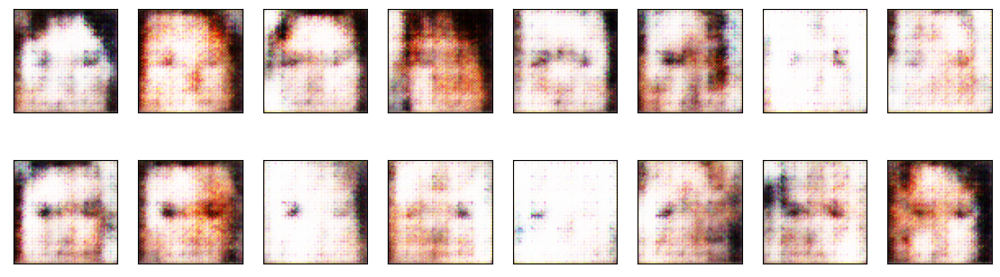

2023-02-13 01:27:47 | Epoch [2/20] | Batch 0/509 | d_loss: -0.6850 | g_loss: -20.7000
2023-02-13 01:27:48 | Epoch [2/20] | Batch 50/509 | d_loss: -0.9084 | g_loss: -19.6748
2023-02-13 01:27:50 | Epoch [2/20] | Batch 100/509 | d_loss: -0.5913 | g_loss: -19.6299
2023-02-13 01:27:52 | Epoch [2/20] | Batch 150/509 | d_loss: -0.6034 | g_loss: -18.1670
2023-02-13 01:27:53 | Epoch [2/20] | Batch 200/509 | d_loss: -0.7380 | g_loss: -18.0748
2023-02-13 01:27:55 | Epoch [2/20] | Batch 250/509 | d_loss: -0.6651 | g_loss: -17.2355
2023-02-13 01:27:57 | Epoch [2/20] | Batch 300/509 | d_loss: -0.6921 | g_loss: -16.5364
2023-02-13 01:27:58 | Epoch [2/20] | Batch 350/509 | d_loss: -1.0933 | g_loss: -16.5889
2023-02-13 01:28:00 | Epoch [2/20] | Batch 400/509 | d_loss: -0.7695 | g_loss: -16.2081
2023-02-13 01:28:02 | Epoch [2/20] | Batch 450/509 | d_loss: -0.8034 | g_loss: -15.6634
2023-02-13 01:28:04 | Epoch [2/20] | Batch 500/509 | d_loss: -0.5585 | g_loss: -15.0148


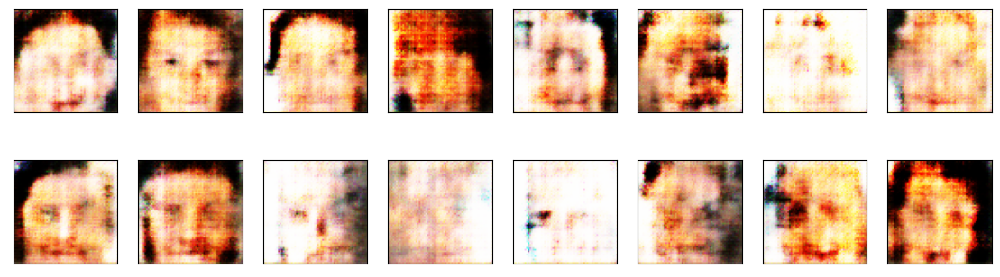

2023-02-13 01:28:05 | Epoch [3/20] | Batch 0/509 | d_loss: -0.6078 | g_loss: -15.2702
2023-02-13 01:28:06 | Epoch [3/20] | Batch 50/509 | d_loss: -0.4549 | g_loss: -14.3756
2023-02-13 01:28:08 | Epoch [3/20] | Batch 100/509 | d_loss: -0.5864 | g_loss: -14.0466
2023-02-13 01:28:10 | Epoch [3/20] | Batch 150/509 | d_loss: -1.0551 | g_loss: -14.2205
2023-02-13 01:28:11 | Epoch [3/20] | Batch 200/509 | d_loss: -0.6388 | g_loss: -13.6739
2023-02-13 01:28:13 | Epoch [3/20] | Batch 250/509 | d_loss: -0.5593 | g_loss: -13.4777
2023-02-13 01:28:15 | Epoch [3/20] | Batch 300/509 | d_loss: -0.7311 | g_loss: -12.7764
2023-02-13 01:28:16 | Epoch [3/20] | Batch 350/509 | d_loss: -0.6668 | g_loss: -12.3783
2023-02-13 01:28:18 | Epoch [3/20] | Batch 400/509 | d_loss: -0.7796 | g_loss: -12.2702
2023-02-13 01:28:20 | Epoch [3/20] | Batch 450/509 | d_loss: -0.5681 | g_loss: -12.3313
2023-02-13 01:28:21 | Epoch [3/20] | Batch 500/509 | d_loss: -0.6887 | g_loss: -11.3822


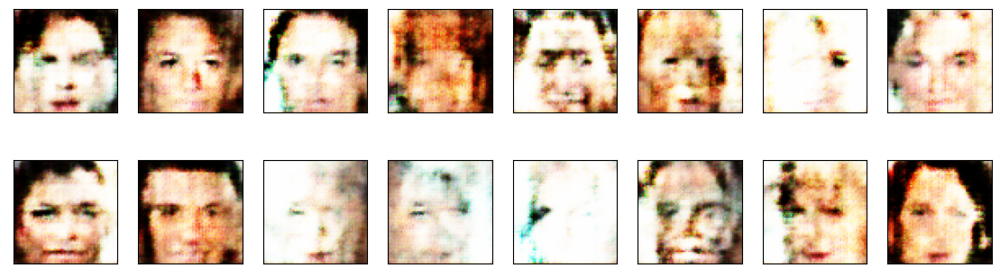

2023-02-13 01:28:22 | Epoch [4/20] | Batch 0/509 | d_loss: -0.4198 | g_loss: -11.2551
2023-02-13 01:28:24 | Epoch [4/20] | Batch 50/509 | d_loss: -0.5843 | g_loss: -11.5751
2023-02-13 01:28:26 | Epoch [4/20] | Batch 100/509 | d_loss: -0.8730 | g_loss: -11.3417
2023-02-13 01:28:27 | Epoch [4/20] | Batch 150/509 | d_loss: -0.7250 | g_loss: -11.3511
2023-02-13 01:28:29 | Epoch [4/20] | Batch 200/509 | d_loss: -0.7331 | g_loss: -10.7052
2023-02-13 01:28:31 | Epoch [4/20] | Batch 250/509 | d_loss: -0.5223 | g_loss: -10.7690
2023-02-13 01:28:33 | Epoch [4/20] | Batch 300/509 | d_loss: -0.4257 | g_loss: -10.4184
2023-02-13 01:28:34 | Epoch [4/20] | Batch 350/509 | d_loss: -0.6588 | g_loss: -10.0127
2023-02-13 01:28:36 | Epoch [4/20] | Batch 400/509 | d_loss: -0.4580 | g_loss: -10.0225
2023-02-13 01:28:38 | Epoch [4/20] | Batch 450/509 | d_loss: -0.4971 | g_loss: -10.3488
2023-02-13 01:28:39 | Epoch [4/20] | Batch 500/509 | d_loss: -0.5732 | g_loss: -9.6332


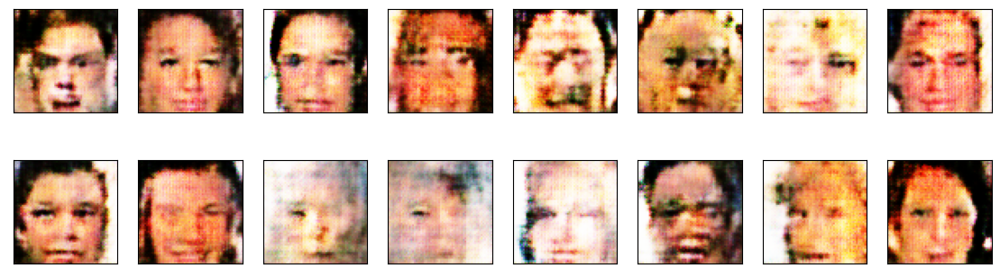

2023-02-13 01:28:40 | Epoch [5/20] | Batch 0/509 | d_loss: -0.4940 | g_loss: -9.4077
2023-02-13 01:28:42 | Epoch [5/20] | Batch 50/509 | d_loss: -0.6392 | g_loss: -9.2894
2023-02-13 01:28:44 | Epoch [5/20] | Batch 100/509 | d_loss: -0.4165 | g_loss: -9.5881
2023-02-13 01:28:45 | Epoch [5/20] | Batch 150/509 | d_loss: -0.6203 | g_loss: -9.5794
2023-02-13 01:28:47 | Epoch [5/20] | Batch 200/509 | d_loss: -0.6813 | g_loss: -9.0427
2023-02-13 01:28:49 | Epoch [5/20] | Batch 250/509 | d_loss: -0.5211 | g_loss: -9.1384
2023-02-13 01:28:50 | Epoch [5/20] | Batch 300/509 | d_loss: -0.3520 | g_loss: -9.0630
2023-02-13 01:28:52 | Epoch [5/20] | Batch 350/509 | d_loss: -0.5776 | g_loss: -8.7423
2023-02-13 01:28:54 | Epoch [5/20] | Batch 400/509 | d_loss: -0.2704 | g_loss: -8.7503
2023-02-13 01:28:55 | Epoch [5/20] | Batch 450/509 | d_loss: -0.2262 | g_loss: -8.5006
2023-02-13 01:28:57 | Epoch [5/20] | Batch 500/509 | d_loss: -0.6302 | g_loss: -8.5962


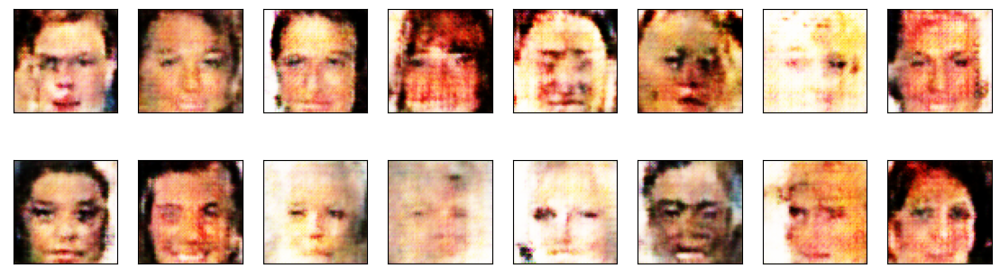

2023-02-13 01:28:58 | Epoch [6/20] | Batch 0/509 | d_loss: -0.5136 | g_loss: -8.5310
2023-02-13 01:29:00 | Epoch [6/20] | Batch 50/509 | d_loss: -0.3329 | g_loss: -8.1173
2023-02-13 01:29:01 | Epoch [6/20] | Batch 100/509 | d_loss: -0.2496 | g_loss: -7.5886
2023-02-13 01:29:03 | Epoch [6/20] | Batch 150/509 | d_loss: -0.3220 | g_loss: -7.5747
2023-02-13 01:29:05 | Epoch [6/20] | Batch 200/509 | d_loss: -0.5349 | g_loss: -7.4295
2023-02-13 01:29:07 | Epoch [6/20] | Batch 250/509 | d_loss: -0.4214 | g_loss: -7.2776
2023-02-13 01:29:08 | Epoch [6/20] | Batch 300/509 | d_loss: -0.7975 | g_loss: -6.5161
2023-02-13 01:29:10 | Epoch [6/20] | Batch 350/509 | d_loss: -0.3340 | g_loss: -6.9633
2023-02-13 01:29:12 | Epoch [6/20] | Batch 400/509 | d_loss: -0.2387 | g_loss: -7.0744
2023-02-13 01:29:13 | Epoch [6/20] | Batch 450/509 | d_loss: -0.5083 | g_loss: -6.5036
2023-02-13 01:29:15 | Epoch [6/20] | Batch 500/509 | d_loss: -0.3689 | g_loss: -6.5431


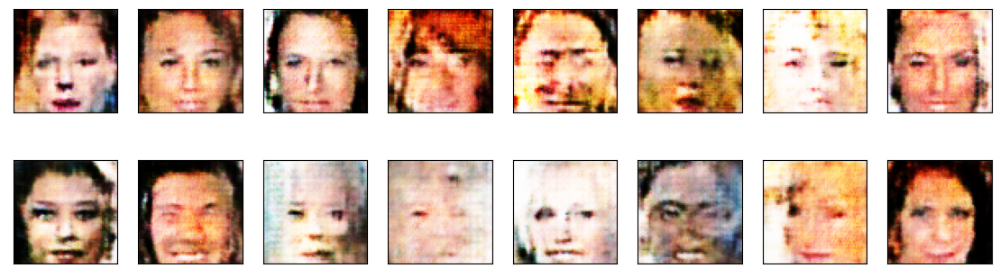

2023-02-13 01:29:16 | Epoch [7/20] | Batch 0/509 | d_loss: -0.5861 | g_loss: -6.5074
2023-02-13 01:29:18 | Epoch [7/20] | Batch 50/509 | d_loss: -0.5272 | g_loss: -6.4139
2023-02-13 01:29:20 | Epoch [7/20] | Batch 100/509 | d_loss: -0.5211 | g_loss: -6.3265
2023-02-13 01:29:21 | Epoch [7/20] | Batch 150/509 | d_loss: -0.3996 | g_loss: -5.8774
2023-02-13 01:29:23 | Epoch [7/20] | Batch 200/509 | d_loss: -0.6569 | g_loss: -5.6293
2023-02-13 01:29:25 | Epoch [7/20] | Batch 250/509 | d_loss: -0.5633 | g_loss: -5.5982
2023-02-13 01:29:26 | Epoch [7/20] | Batch 300/509 | d_loss: -0.4258 | g_loss: -5.6284
2023-02-13 01:29:28 | Epoch [7/20] | Batch 350/509 | d_loss: -0.2756 | g_loss: -5.7145
2023-02-13 01:29:30 | Epoch [7/20] | Batch 400/509 | d_loss: -0.5693 | g_loss: -5.5666
2023-02-13 01:29:32 | Epoch [7/20] | Batch 450/509 | d_loss: -0.4422 | g_loss: -5.2917
2023-02-13 01:29:33 | Epoch [7/20] | Batch 500/509 | d_loss: -0.3738 | g_loss: -5.7228


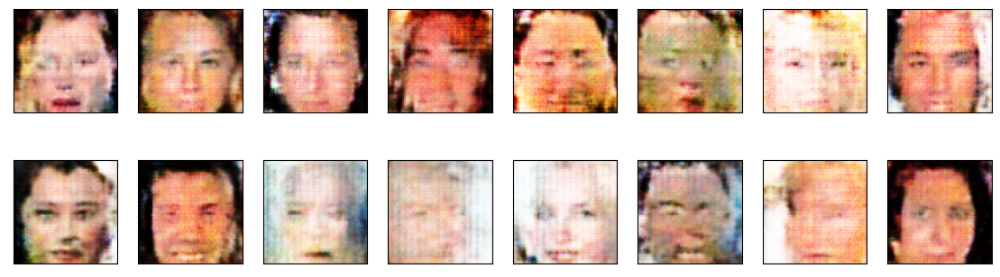

2023-02-13 01:29:34 | Epoch [8/20] | Batch 0/509 | d_loss: -0.3472 | g_loss: -5.1929
2023-02-13 01:29:36 | Epoch [8/20] | Batch 50/509 | d_loss: -0.2879 | g_loss: -5.0880
2023-02-13 01:29:38 | Epoch [8/20] | Batch 100/509 | d_loss: -0.6062 | g_loss: -4.8298
2023-02-13 01:29:39 | Epoch [8/20] | Batch 150/509 | d_loss: -0.5033 | g_loss: -4.8175
2023-02-13 01:29:41 | Epoch [8/20] | Batch 200/509 | d_loss: -0.3535 | g_loss: -4.6964
2023-02-13 01:29:43 | Epoch [8/20] | Batch 250/509 | d_loss: -0.3744 | g_loss: -4.7035
2023-02-13 01:29:44 | Epoch [8/20] | Batch 300/509 | d_loss: -0.4301 | g_loss: -4.4712
2023-02-13 01:29:46 | Epoch [8/20] | Batch 350/509 | d_loss: -0.6038 | g_loss: -4.1115
2023-02-13 01:29:48 | Epoch [8/20] | Batch 400/509 | d_loss: -0.3243 | g_loss: -4.4584
2023-02-13 01:29:49 | Epoch [8/20] | Batch 450/509 | d_loss: -0.2829 | g_loss: -4.7111
2023-02-13 01:29:51 | Epoch [8/20] | Batch 500/509 | d_loss: -0.7286 | g_loss: -4.1847


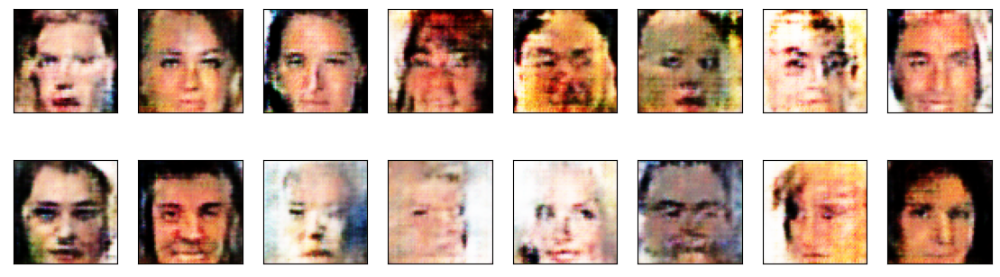

2023-02-13 01:29:52 | Epoch [9/20] | Batch 0/509 | d_loss: -0.3936 | g_loss: -4.6272
2023-02-13 01:29:54 | Epoch [9/20] | Batch 50/509 | d_loss: -0.4606 | g_loss: -4.5609
2023-02-13 01:29:56 | Epoch [9/20] | Batch 100/509 | d_loss: -0.4868 | g_loss: -4.6675
2023-02-13 01:29:57 | Epoch [9/20] | Batch 150/509 | d_loss: -0.4323 | g_loss: -4.3135
2023-02-13 01:29:59 | Epoch [9/20] | Batch 200/509 | d_loss: -0.4466 | g_loss: -4.4506
2023-02-13 01:30:01 | Epoch [9/20] | Batch 250/509 | d_loss: -0.4081 | g_loss: -4.2626
2023-02-13 01:30:02 | Epoch [9/20] | Batch 300/509 | d_loss: -0.2849 | g_loss: -3.9165
2023-02-13 01:30:04 | Epoch [9/20] | Batch 350/509 | d_loss: -0.4295 | g_loss: -4.1125
2023-02-13 01:30:06 | Epoch [9/20] | Batch 400/509 | d_loss: -0.3241 | g_loss: -4.6643
2023-02-13 01:30:08 | Epoch [9/20] | Batch 450/509 | d_loss: -0.4975 | g_loss: -3.6700
2023-02-13 01:30:09 | Epoch [9/20] | Batch 500/509 | d_loss: -0.3524 | g_loss: -4.0715


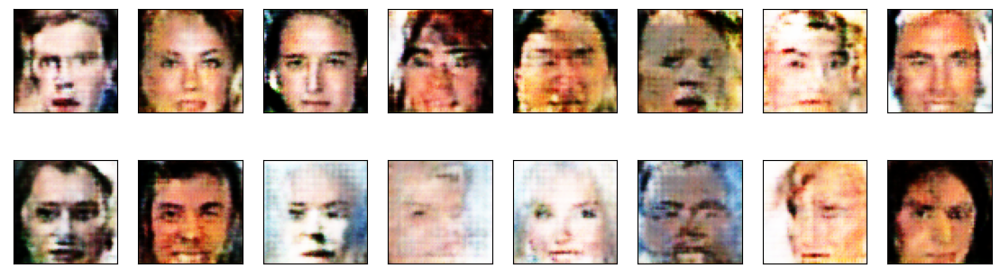

2023-02-13 01:30:10 | Epoch [10/20] | Batch 0/509 | d_loss: -0.4690 | g_loss: -4.2447
2023-02-13 01:30:12 | Epoch [10/20] | Batch 50/509 | d_loss: -0.4796 | g_loss: -4.0526
2023-02-13 01:30:14 | Epoch [10/20] | Batch 100/509 | d_loss: -0.5474 | g_loss: -3.8485
2023-02-13 01:30:15 | Epoch [10/20] | Batch 150/509 | d_loss: -0.3940 | g_loss: -4.2093
2023-02-13 01:30:17 | Epoch [10/20] | Batch 200/509 | d_loss: -0.3452 | g_loss: -4.5304
2023-02-13 01:30:19 | Epoch [10/20] | Batch 250/509 | d_loss: -0.4067 | g_loss: -4.4401
2023-02-13 01:30:21 | Epoch [10/20] | Batch 300/509 | d_loss: -0.3152 | g_loss: -3.8617
2023-02-13 01:30:22 | Epoch [10/20] | Batch 350/509 | d_loss: -0.6026 | g_loss: -3.4889
2023-02-13 01:30:24 | Epoch [10/20] | Batch 400/509 | d_loss: -0.4755 | g_loss: -3.7426
2023-02-13 01:30:26 | Epoch [10/20] | Batch 450/509 | d_loss: -0.3749 | g_loss: -3.8515
2023-02-13 01:30:27 | Epoch [10/20] | Batch 500/509 | d_loss: -0.4014 | g_loss: -4.1844


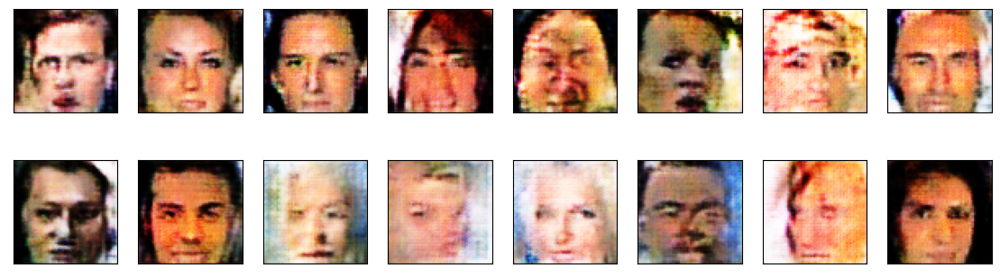

2023-02-13 01:30:28 | Epoch [11/20] | Batch 0/509 | d_loss: -0.5158 | g_loss: -3.9218
2023-02-13 01:30:30 | Epoch [11/20] | Batch 50/509 | d_loss: -0.3373 | g_loss: -3.8651
2023-02-13 01:30:32 | Epoch [11/20] | Batch 100/509 | d_loss: -0.3159 | g_loss: -4.0258
2023-02-13 01:30:33 | Epoch [11/20] | Batch 150/509 | d_loss: -0.4181 | g_loss: -4.3289
2023-02-13 01:30:35 | Epoch [11/20] | Batch 200/509 | d_loss: -0.5294 | g_loss: -4.3494
2023-02-13 01:30:37 | Epoch [11/20] | Batch 250/509 | d_loss: -0.4244 | g_loss: -4.4304
2023-02-13 01:30:39 | Epoch [11/20] | Batch 300/509 | d_loss: -0.2720 | g_loss: -4.0804
2023-02-13 01:30:40 | Epoch [11/20] | Batch 350/509 | d_loss: -0.3516 | g_loss: -3.8129
2023-02-13 01:30:42 | Epoch [11/20] | Batch 400/509 | d_loss: -0.5972 | g_loss: -3.8186
2023-02-13 01:30:44 | Epoch [11/20] | Batch 450/509 | d_loss: -0.3321 | g_loss: -3.9253
2023-02-13 01:30:45 | Epoch [11/20] | Batch 500/509 | d_loss: -0.4605 | g_loss: -3.9611


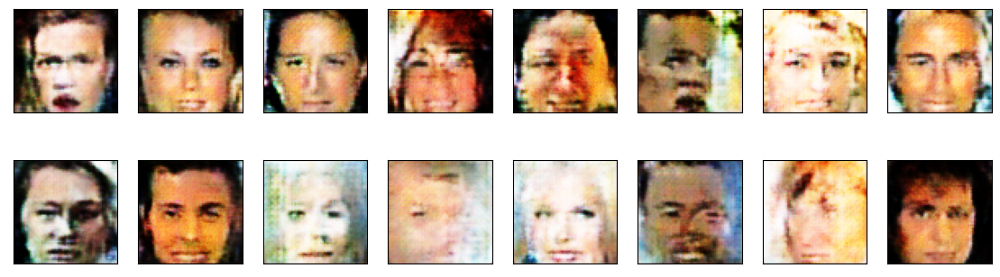

2023-02-13 01:30:47 | Epoch [12/20] | Batch 0/509 | d_loss: -0.5785 | g_loss: -3.8402
2023-02-13 01:30:48 | Epoch [12/20] | Batch 50/509 | d_loss: -0.4866 | g_loss: -3.2972
2023-02-13 01:30:50 | Epoch [12/20] | Batch 100/509 | d_loss: -0.4799 | g_loss: -3.6989
2023-02-13 01:30:52 | Epoch [12/20] | Batch 150/509 | d_loss: -0.5138 | g_loss: -4.4254
2023-02-13 01:30:53 | Epoch [12/20] | Batch 200/509 | d_loss: -0.5401 | g_loss: -4.0633
2023-02-13 01:30:55 | Epoch [12/20] | Batch 250/509 | d_loss: -0.2783 | g_loss: -4.3231
2023-02-13 01:30:57 | Epoch [12/20] | Batch 300/509 | d_loss: -0.2752 | g_loss: -4.1953
2023-02-13 01:30:59 | Epoch [12/20] | Batch 350/509 | d_loss: -0.5587 | g_loss: -3.8382
2023-02-13 01:31:00 | Epoch [12/20] | Batch 400/509 | d_loss: -0.4327 | g_loss: -4.3166
2023-02-13 01:31:02 | Epoch [12/20] | Batch 450/509 | d_loss: -0.2135 | g_loss: -3.6653
2023-02-13 01:31:04 | Epoch [12/20] | Batch 500/509 | d_loss: -0.3337 | g_loss: -3.9645


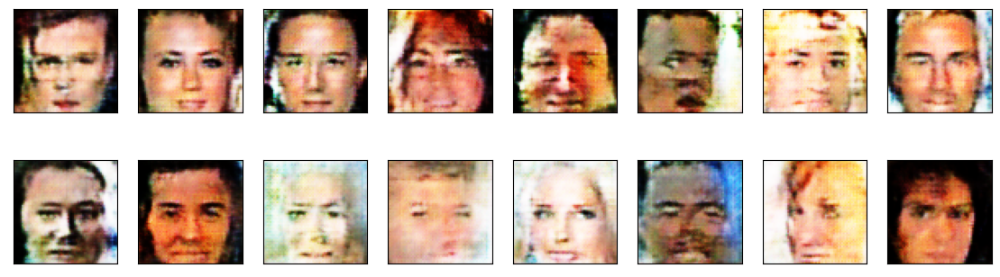

2023-02-13 01:31:05 | Epoch [13/20] | Batch 0/509 | d_loss: -0.3507 | g_loss: -4.2164
2023-02-13 01:31:06 | Epoch [13/20] | Batch 50/509 | d_loss: -0.3923 | g_loss: -4.1946
2023-02-13 01:31:08 | Epoch [13/20] | Batch 100/509 | d_loss: -0.4710 | g_loss: -4.4071
2023-02-13 01:31:10 | Epoch [13/20] | Batch 150/509 | d_loss: -0.3444 | g_loss: -4.3391
2023-02-13 01:31:12 | Epoch [13/20] | Batch 200/509 | d_loss: -0.3333 | g_loss: -3.9926
2023-02-13 01:31:13 | Epoch [13/20] | Batch 250/509 | d_loss: -0.3018 | g_loss: -3.9072
2023-02-13 01:31:15 | Epoch [13/20] | Batch 300/509 | d_loss: -0.4610 | g_loss: -3.8898
2023-02-13 01:31:17 | Epoch [13/20] | Batch 350/509 | d_loss: -0.2765 | g_loss: -3.7230
2023-02-13 01:31:18 | Epoch [13/20] | Batch 400/509 | d_loss: -0.2762 | g_loss: -4.2448
2023-02-13 01:31:20 | Epoch [13/20] | Batch 450/509 | d_loss: -0.3995 | g_loss: -4.3170
2023-02-13 01:31:22 | Epoch [13/20] | Batch 500/509 | d_loss: -0.3225 | g_loss: -4.5534


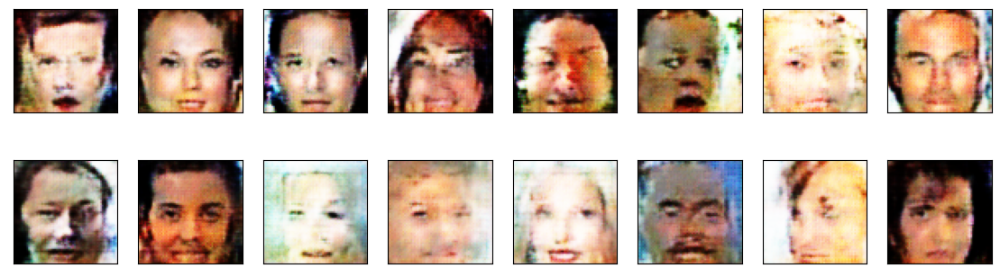

2023-02-13 01:31:23 | Epoch [14/20] | Batch 0/509 | d_loss: -0.3864 | g_loss: -4.3328
2023-02-13 01:31:25 | Epoch [14/20] | Batch 50/509 | d_loss: -0.2929 | g_loss: -4.3406
2023-02-13 01:31:26 | Epoch [14/20] | Batch 100/509 | d_loss: -0.2845 | g_loss: -4.6013
2023-02-13 01:31:28 | Epoch [14/20] | Batch 150/509 | d_loss: -0.2743 | g_loss: -4.3859
2023-02-13 01:31:30 | Epoch [14/20] | Batch 200/509 | d_loss: -0.3758 | g_loss: -4.8266
2023-02-13 01:31:31 | Epoch [14/20] | Batch 250/509 | d_loss: -0.3879 | g_loss: -3.7156
2023-02-13 01:31:33 | Epoch [14/20] | Batch 300/509 | d_loss: -0.4015 | g_loss: -4.2131
2023-02-13 01:31:35 | Epoch [14/20] | Batch 350/509 | d_loss: -0.2962 | g_loss: -4.2654
2023-02-13 01:31:36 | Epoch [14/20] | Batch 400/509 | d_loss: -0.5069 | g_loss: -3.9218
2023-02-13 01:31:38 | Epoch [14/20] | Batch 450/509 | d_loss: -0.2177 | g_loss: -4.3569
2023-02-13 01:31:40 | Epoch [14/20] | Batch 500/509 | d_loss: -0.3636 | g_loss: -4.4469


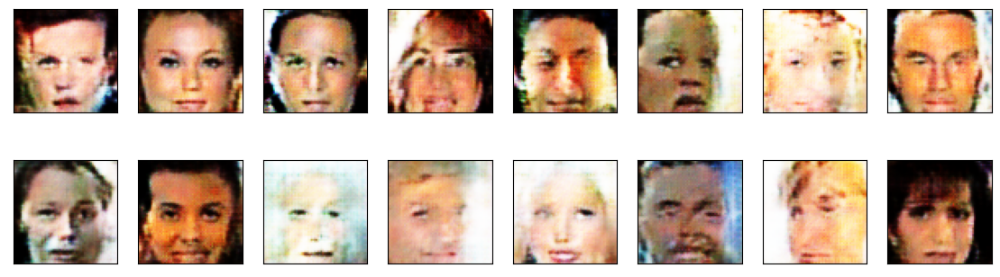

2023-02-13 01:31:41 | Epoch [15/20] | Batch 0/509 | d_loss: -0.6844 | g_loss: -3.5091
2023-02-13 01:31:43 | Epoch [15/20] | Batch 50/509 | d_loss: -0.6810 | g_loss: -4.5966
2023-02-13 01:31:45 | Epoch [15/20] | Batch 100/509 | d_loss: -0.1272 | g_loss: -4.2428
2023-02-13 01:31:46 | Epoch [15/20] | Batch 150/509 | d_loss: -0.4784 | g_loss: -4.6108
2023-02-13 01:31:48 | Epoch [15/20] | Batch 200/509 | d_loss: -0.2930 | g_loss: -4.0390
2023-02-13 01:31:50 | Epoch [15/20] | Batch 250/509 | d_loss: -0.3083 | g_loss: -3.8466
2023-02-13 01:31:51 | Epoch [15/20] | Batch 300/509 | d_loss: -0.5599 | g_loss: -3.6089
2023-02-13 01:31:53 | Epoch [15/20] | Batch 350/509 | d_loss: -0.5318 | g_loss: -4.1898
2023-02-13 01:31:55 | Epoch [15/20] | Batch 400/509 | d_loss: -0.3093 | g_loss: -3.9579
2023-02-13 01:31:57 | Epoch [15/20] | Batch 450/509 | d_loss: -0.2646 | g_loss: -4.2266
2023-02-13 01:31:58 | Epoch [15/20] | Batch 500/509 | d_loss: -0.3759 | g_loss: -3.8700


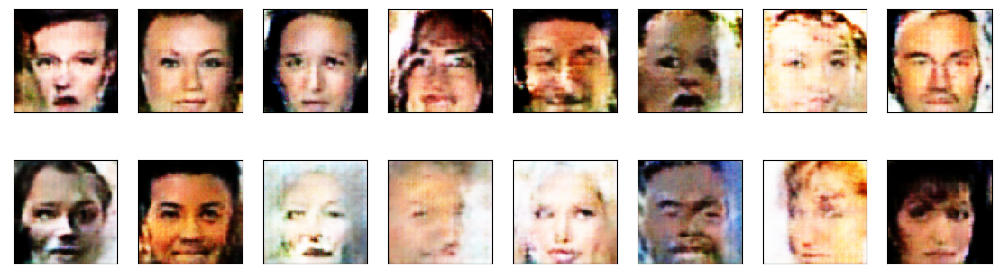

2023-02-13 01:31:59 | Epoch [16/20] | Batch 0/509 | d_loss: -0.2730 | g_loss: -4.0244
2023-02-13 01:32:01 | Epoch [16/20] | Batch 50/509 | d_loss: -0.3777 | g_loss: -3.8868
2023-02-13 01:32:03 | Epoch [16/20] | Batch 100/509 | d_loss: -0.3650 | g_loss: -3.7036
2023-02-13 01:32:05 | Epoch [16/20] | Batch 150/509 | d_loss: -0.5817 | g_loss: -3.5420
2023-02-13 01:32:06 | Epoch [16/20] | Batch 200/509 | d_loss: -0.4100 | g_loss: -4.4533
2023-02-13 01:32:08 | Epoch [16/20] | Batch 250/509 | d_loss: -0.4080 | g_loss: -4.6245
2023-02-13 01:32:10 | Epoch [16/20] | Batch 300/509 | d_loss: -0.4869 | g_loss: -3.8425
2023-02-13 01:32:11 | Epoch [16/20] | Batch 350/509 | d_loss: -0.4632 | g_loss: -3.5625
2023-02-13 01:32:13 | Epoch [16/20] | Batch 400/509 | d_loss: -0.4062 | g_loss: -4.1154
2023-02-13 01:32:15 | Epoch [16/20] | Batch 450/509 | d_loss: -0.2535 | g_loss: -3.7308
2023-02-13 01:32:17 | Epoch [16/20] | Batch 500/509 | d_loss: -0.3118 | g_loss: -4.0815


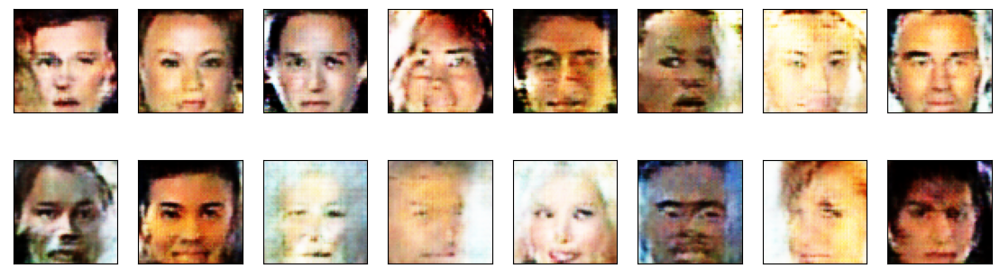

2023-02-13 01:32:18 | Epoch [17/20] | Batch 0/509 | d_loss: -0.2742 | g_loss: -4.4010
2023-02-13 01:32:19 | Epoch [17/20] | Batch 50/509 | d_loss: -0.5117 | g_loss: -3.7526
2023-02-13 01:32:21 | Epoch [17/20] | Batch 100/509 | d_loss: -0.3448 | g_loss: -4.4597
2023-02-13 01:32:23 | Epoch [17/20] | Batch 150/509 | d_loss: -0.3503 | g_loss: -4.3197
2023-02-13 01:32:25 | Epoch [17/20] | Batch 200/509 | d_loss: -0.4676 | g_loss: -4.4798
2023-02-13 01:32:26 | Epoch [17/20] | Batch 250/509 | d_loss: -0.3010 | g_loss: -4.1621
2023-02-13 01:32:28 | Epoch [17/20] | Batch 300/509 | d_loss: -0.3188 | g_loss: -4.0982
2023-02-13 01:32:30 | Epoch [17/20] | Batch 350/509 | d_loss: -0.5201 | g_loss: -4.3081
2023-02-13 01:32:31 | Epoch [17/20] | Batch 400/509 | d_loss: -0.4269 | g_loss: -4.2280
2023-02-13 01:32:33 | Epoch [17/20] | Batch 450/509 | d_loss: -0.2465 | g_loss: -4.6772
2023-02-13 01:32:35 | Epoch [17/20] | Batch 500/509 | d_loss: -0.3735 | g_loss: -4.4877


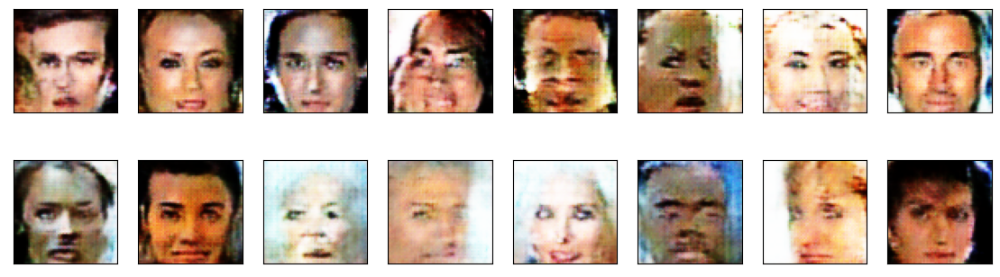

2023-02-13 01:32:36 | Epoch [18/20] | Batch 0/509 | d_loss: -0.3594 | g_loss: -4.1367
2023-02-13 01:32:37 | Epoch [18/20] | Batch 50/509 | d_loss: -0.3507 | g_loss: -3.9245
2023-02-13 01:32:39 | Epoch [18/20] | Batch 100/509 | d_loss: -0.5132 | g_loss: -4.4392
2023-02-13 01:32:41 | Epoch [18/20] | Batch 150/509 | d_loss: -0.4773 | g_loss: -4.8051
2023-02-13 01:32:43 | Epoch [18/20] | Batch 200/509 | d_loss: -0.2603 | g_loss: -4.3385
2023-02-13 01:32:44 | Epoch [18/20] | Batch 250/509 | d_loss: -0.2658 | g_loss: -4.1796
2023-02-13 01:32:46 | Epoch [18/20] | Batch 300/509 | d_loss: -0.8477 | g_loss: -4.7875
2023-02-13 01:32:48 | Epoch [18/20] | Batch 350/509 | d_loss: -0.3509 | g_loss: -4.3274
2023-02-13 01:32:50 | Epoch [18/20] | Batch 400/509 | d_loss: -0.3993 | g_loss: -3.9154
2023-02-13 01:32:51 | Epoch [18/20] | Batch 450/509 | d_loss: -0.4155 | g_loss: -4.0916
2023-02-13 01:32:53 | Epoch [18/20] | Batch 500/509 | d_loss: -0.3197 | g_loss: -4.1205


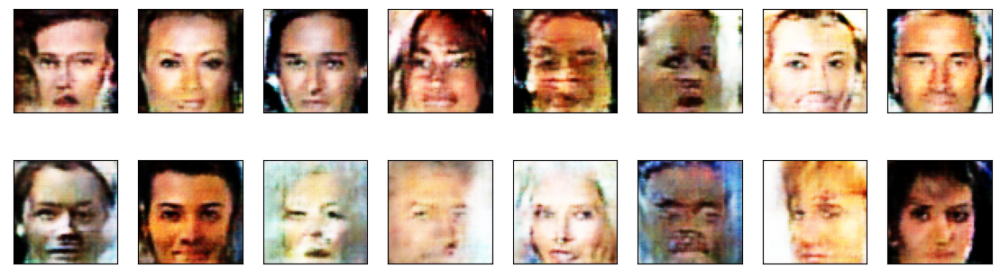

2023-02-13 01:32:54 | Epoch [19/20] | Batch 0/509 | d_loss: -0.3901 | g_loss: -4.5116
2023-02-13 01:32:56 | Epoch [19/20] | Batch 50/509 | d_loss: -0.3287 | g_loss: -4.1130
2023-02-13 01:32:58 | Epoch [19/20] | Batch 100/509 | d_loss: -0.2603 | g_loss: -4.4427
2023-02-13 01:32:59 | Epoch [19/20] | Batch 150/509 | d_loss: -0.5300 | g_loss: -4.0734
2023-02-13 01:33:01 | Epoch [19/20] | Batch 200/509 | d_loss: -0.5789 | g_loss: -3.3383
2023-02-13 01:33:03 | Epoch [19/20] | Batch 250/509 | d_loss: -0.5359 | g_loss: -4.3884
2023-02-13 01:33:04 | Epoch [19/20] | Batch 300/509 | d_loss: -0.2269 | g_loss: -4.4457
2023-02-13 01:33:06 | Epoch [19/20] | Batch 350/509 | d_loss: -0.2721 | g_loss: -4.1403
2023-02-13 01:33:08 | Epoch [19/20] | Batch 400/509 | d_loss: -0.3917 | g_loss: -4.2780
2023-02-13 01:33:09 | Epoch [19/20] | Batch 450/509 | d_loss: -0.3530 | g_loss: -4.6389
2023-02-13 01:33:11 | Epoch [19/20] | Batch 500/509 | d_loss: -0.2888 | g_loss: -4.2165


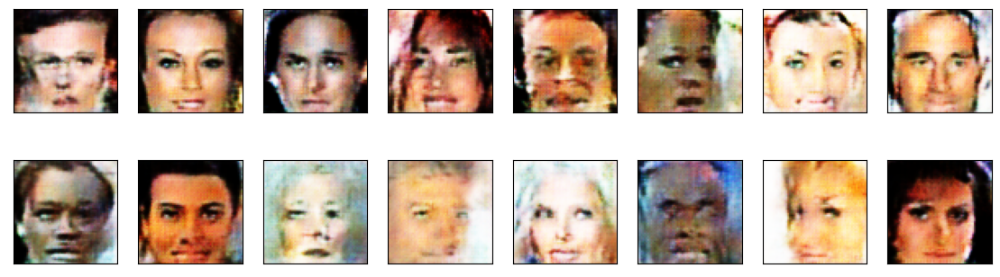

2023-02-13 01:33:12 | Epoch [20/20] | Batch 0/509 | d_loss: -0.3680 | g_loss: -4.4322
2023-02-13 01:33:14 | Epoch [20/20] | Batch 50/509 | d_loss: -0.3043 | g_loss: -4.1513
2023-02-13 01:33:16 | Epoch [20/20] | Batch 100/509 | d_loss: -0.4415 | g_loss: -4.2483
2023-02-13 01:33:18 | Epoch [20/20] | Batch 150/509 | d_loss: -0.3465 | g_loss: -3.7083
2023-02-13 01:33:19 | Epoch [20/20] | Batch 200/509 | d_loss: -0.5911 | g_loss: -4.6619
2023-02-13 01:33:21 | Epoch [20/20] | Batch 250/509 | d_loss: -0.5157 | g_loss: -4.7437
2023-02-13 01:33:23 | Epoch [20/20] | Batch 300/509 | d_loss: -0.4684 | g_loss: -4.8429
2023-02-13 01:33:25 | Epoch [20/20] | Batch 350/509 | d_loss: -0.4124 | g_loss: -4.4473
2023-02-13 01:33:26 | Epoch [20/20] | Batch 400/509 | d_loss: -0.5981 | g_loss: -4.5882
2023-02-13 01:33:28 | Epoch [20/20] | Batch 450/509 | d_loss: -0.2856 | g_loss: -4.0283
2023-02-13 01:33:30 | Epoch [20/20] | Batch 500/509 | d_loss: -0.3078 | g_loss: -4.2265


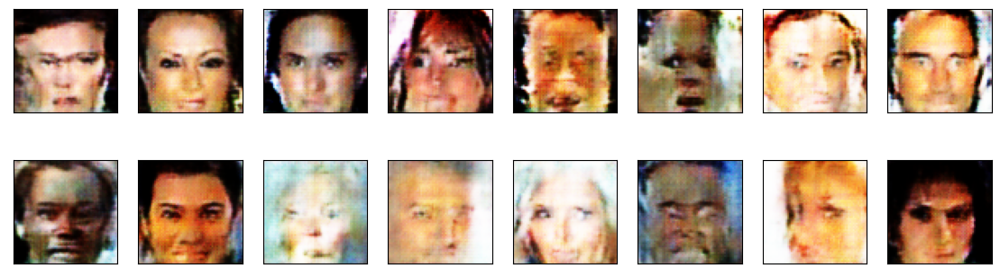

In [23]:
writer = SummaryWriter(f"runs/WDRAGAN_{datetime.now():%Y-%m-%d_%H-%M-%S}", 
                      comment=f"with Wasserstein loss, train generator 5 times more")

fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().to(device)

losses = []
for epoch in range(n_epochs):
    for batch_i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)
        
        ####################################
        
        # TODO: implement the training strategy
        
        ####################################
        
        # ============================================
        #          TRAIN THE DISCRIMINATOR
        # ============================================

        for _ in range(1):
            # noise = torch.ones(real_images.shape)
            # noise = noise.view(-1)
            # noisy_portion = noise.size()[0] // 100
            # noisy_idx = np.random.choice(list(range(noise.size()[0])), noisy_portion)
            # random_pool = 2 * np.random.rand(noisy_portion) - 1
            # for i in range(noisy_portion):
            #     noise[noisy_idx[i]] = random_pool[i]
            # noise = noise.view(real_images.shape).cuda()
            # noisy_real_images = real_images * noise
            
            d_loss = discriminator_step(discriminator, d_optimizer, batch_size, latent_dim, real_images)

        # =========================================
        #            TRAIN THE GENERATOR
        # =========================================

        for _ in range(1):
            g_loss = generator_step(generator, discriminator, g_optimizer, batch_size, latent_dim)

        # =========================================
        #          LOGGING AND VISUALIZATION
        # =========================================
                
        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            d = d_loss['loss'].item()
            g = g_loss['loss'].item()
            losses.append((d, g))

            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Epoch [{epoch+1}/{n_epochs}] | Batch {batch_i}/{len(dataloader)} | d_loss: {d:.4f} | g_loss: {g:.4f}')
            writer.add_scalar('d_loss', d, epoch * len(dataloader) + batch_i)
            writer.add_scalar('g_loss', g, epoch * len(dataloader) + batch_i)

            # save fid score
            generated_images = generator(fixed_latent_vector)
            fid = calculate_fid(real_images, generated_images)
            writer.add_scalar('fid', fid, epoch * len(dataloader) + batch_i)

    # display images during training
    generator.eval()
    generated_images = generator(fixed_latent_vector)
    display(generated_images)

    # save image for tensorboard
    grid = torchvision.utils.make_grid(torch.from_numpy(denormalize(generated_images.detach().cpu().numpy())))
    writer.add_image('images', grid, epoch)

    generator.train()

writer.close()

### Training losses

Plot the training losses for the generator and discriminator.

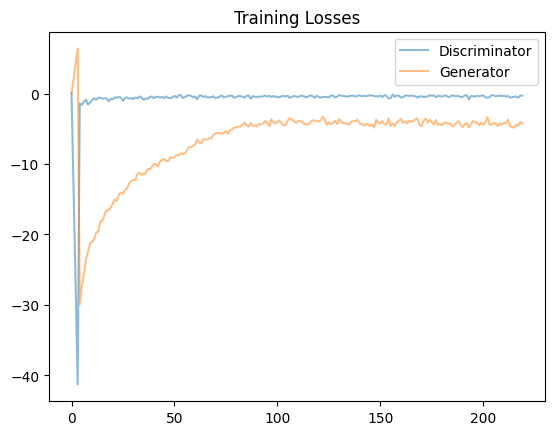

In [24]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result
* Loss functions

**Answer:** (Write your answer in this cell)

A basic DCGAN did not produce a satisfactory level of the human face image in 64x64 resolution. Tensorboard with loss graph and image visualization helped a lot in applying the ablation study. Frechet Inception Distance was an excellent metric to estimate the generated image quality. 

Like any other deep learning model, a good loss function leads us to a good result. Wasserstein loss and gradient penalty from WGAN-GP and DRAGAN were very useful in reducing the FID score by around 200 points. However, there are some limitations.

Although the overall quality of the result has improved, it does not reach the beauty of real images, and the quality of some images is very low. It is the limitation of DCGAN, and we could overcome it with larger and more complex models such as StyleGAN.

In addition, most of the generated portraits have facial features of Caucasians because the training data primarily consists of Caucasian celebrities' faces. Therefore, it is necessary to train with such unbiased data.



### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb".  

Submit the notebook using the ***SUBMIT*** button in the bottom right corner of the Project Workspace.